In [85]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [90]:
# Параметры
L = 10 # Длина отрезка
T = 1 # Время моделирования
alpha = 1 # Коэффициент теплопроводности
Nx = 50 # Число узлов по x
Nt = 100 # Число узлов по t

In [91]:
# Шаги
h = L / Nx
tau = T / Nt
lambda_ = (alpha * tau) / h**2
print(f'lambda = {lambda_}')

lambda = 0.24999999999999994


In [92]:
# Проверка устойчивости
if lambda_ > 0.5:
  raise ValueError("Схема неустойчива! Уменьшите tau.")

In [93]:
# Создание сетки
x = np.linspace(0, L, Nx+1)
t = np.linspace(0, T, Nt+1)

In [118]:
# Начальное условие
u = np.zeros((Nx+1, Nt+1))
#u[:, 0] = np.sin(np.pi * x)
u[:, 0] = np.where((x >= 5), 1, 0)

In [119]:
# Явная схема
for n in range(Nt):
  for i in range(1, Nx):
    u[i, n+1] = u[i, n] + lambda_ * (u[i+1, n] - 2*u[i, n] + u[i-1, n])
  # Граничные условия
  u[0, n+1] = 0
  u[Nx, n+1] = 0

In [120]:
fig, ax = plt.subplots(figsize=(8, 6))

line, = ax.plot([], [], label='u(x, t)')
ax.set_xlabel('x')
ax.set_ylabel('u(x, t)')
ax.set_title('Решение уравнения теплопроводности')
ax.set_xlim(x.min(), x.max())
ax.set_ylim(u.min()-1, u.max()+1)
ax.grid()
ax.legend()


def animate(n):
    line.set_data(x, u[:, n])
    return line,

plt.close()

ani = animation.FuncAnimation(fig, animate, frames=len(t), interval=50, blit=True)

display(HTML(ani.to_jshtml()))

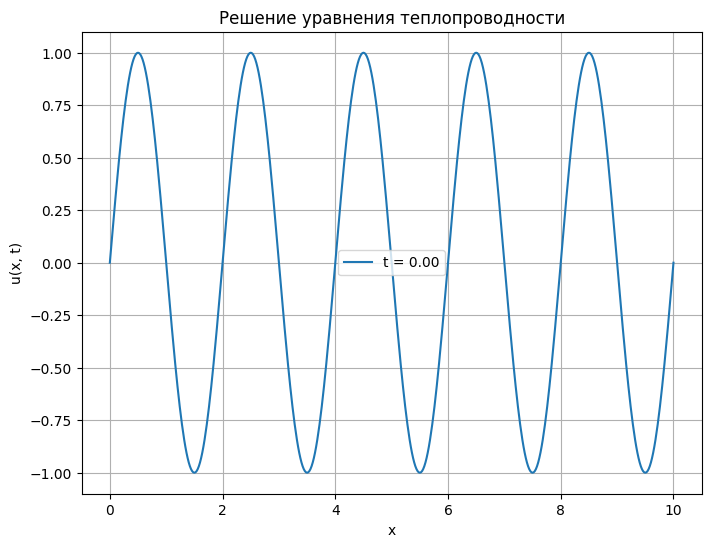

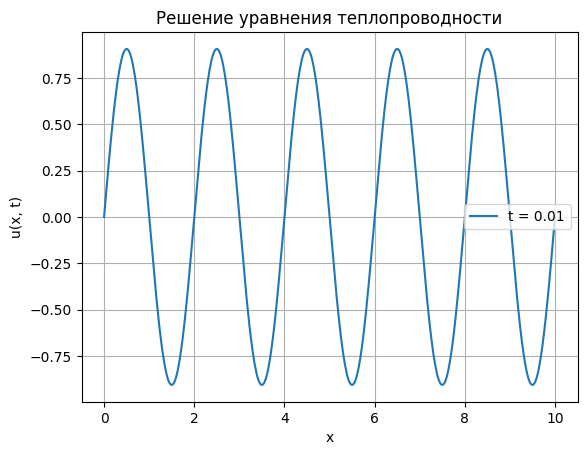

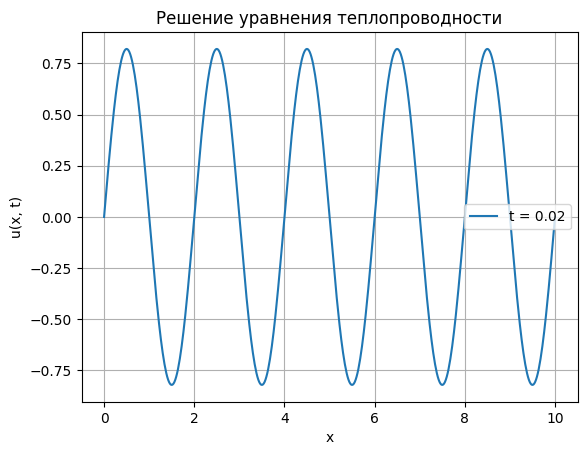

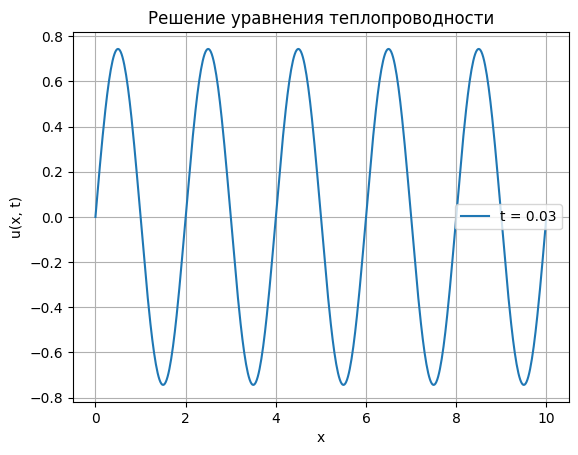

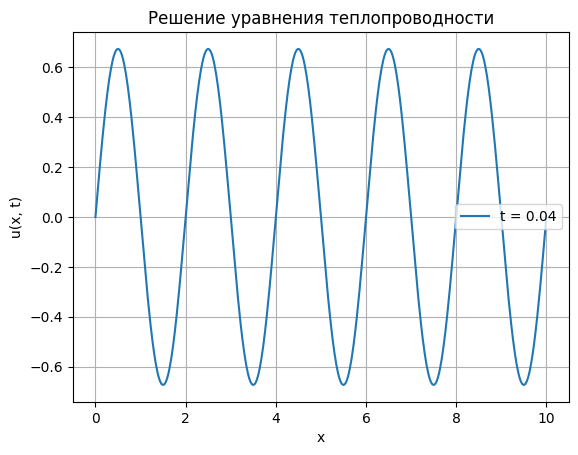

...

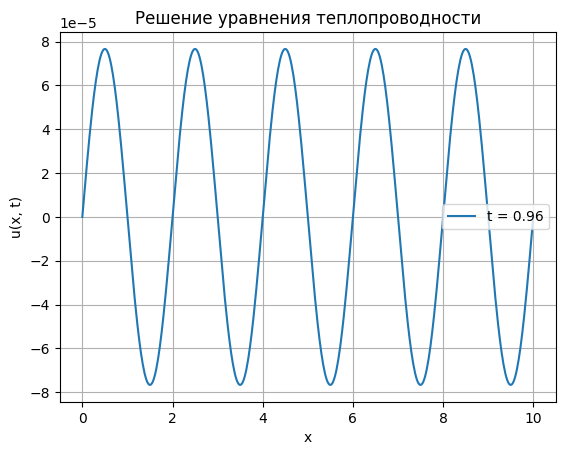

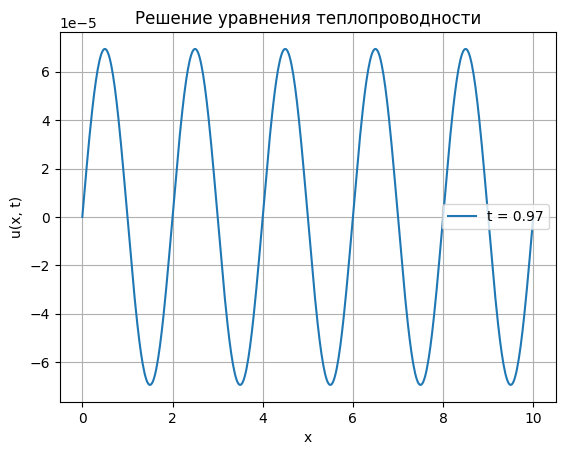

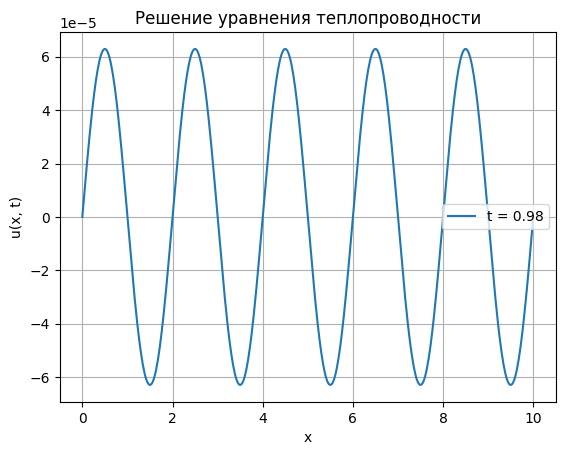

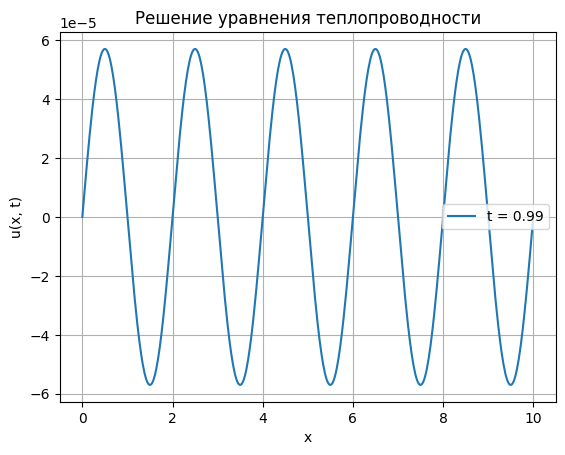

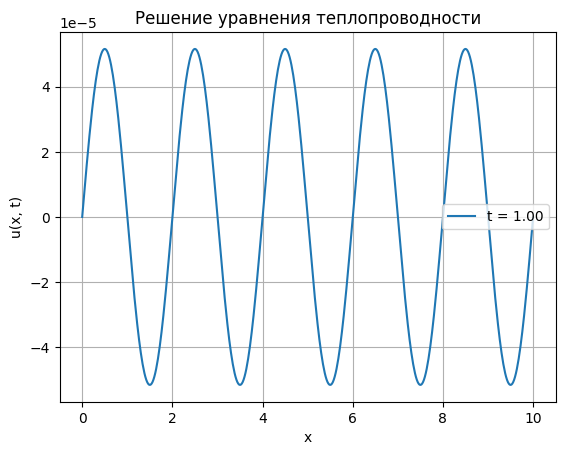

In [84]:
# Визуализация
plt.figure(figsize=(8, 6))
for n in range(0, Nt+1, 100):
  plt.plot(x, u[:, n], label=f't = {t[n]:.2f}')
  plt.xlabel('x')
  plt.ylabel('u(x, t)')
  plt.title('Решение уравнения теплопроводности')
  plt.legend()
  plt.grid()
  plt.show()